# IMA 208 TP5: homography estimation

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

In this practical work, we will study how to estimate an homography between two given images. We will consider both the simple DLT algorithm (part I) and the RANSAC algorithm (part II).

To reduce the time you need for this practical work, we will use a few pre-implemented functions of openCV. Make sure that your library installation is correct before starting to work.

# Part 1: homography estimation from hand-selected keypoints: DLT algorithm

We assume that we have an image of a documents suffering from severe perspective distortion. The objective of this part is to warp this image (denoted in the following as img2) to remove the distortion using a reference image beeing in the desired pose (denoted as img1).

The following cell enables to vizualize the images using openCV.

(<Figure size 640x480 with 1 Axes>,
 <matplotlib.image.AxesImage at 0x2873889dcd0>)

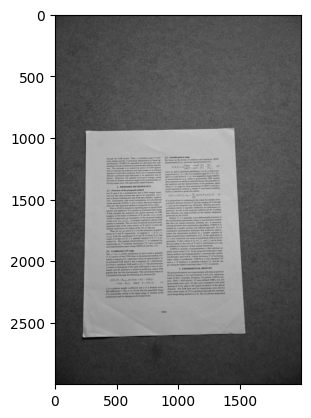

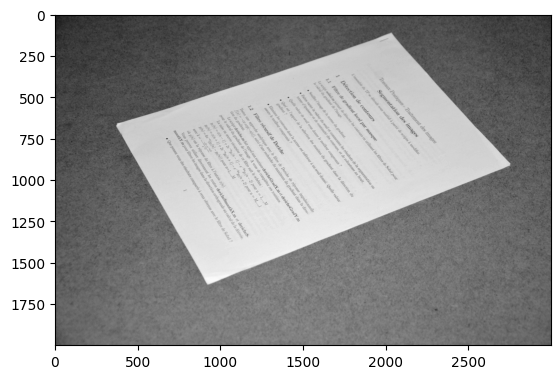

In [2]:
img1 = cv2.cvtColor(cv2.imread('Feuille_redressee.jpg'),cv2.COLOR_BGR2GRAY) # Reference image
img2 = cv2.cvtColor(cv2.imread('Feuille.jpg'),cv2.COLOR_BGR2GRAY) # Image to be processed

plt.figure(),plt.imshow(img1,cmap='gray')
plt.figure(),plt.imshow(img2,cmap='gray')

To correct the homography beetween the to images, we will need some points to match between the two images.

**Question:** how many points do you at least need to estimate the homography? Why?

**Answer:** To estimate a homography between two images, at least 4 point correspondences between the two images are needed. 

A homography is a 3x3 transformation matrix that describes the translation, rotation, scaling, and perspective distortion between two planes—in this case, the planes represented by the two images. Mathematically, a homography $H$ relates a point $(x, y)$ in one image to a point $(x', y')$ in the second image through the following equation:

$$
\begin{pmatrix}
x' \\
y' \\
w'
\end{pmatrix}
= H \cdot
\begin{pmatrix}
x \\
y \\
1
\end{pmatrix}
$$

Where $H$ is the homography matrix, and $w'$ is a scaling factor due to the homogenous coordinate system.

Each point correspondence provides two equations (one for $x'$ and one for $y'$), but because the homography matrix has 8 degrees of freedom (the 9th value is a scale factor that can be set to 1), at least 4 point correspondences are needed to provide the 8 equations necessary to solve for the homography matrix. This allows you to uniquely determine the homography, assuming the points are not collinear and there are no degenerate configurations.

**Implementation:** to estimate the homography, some matching keypoints between the reference image and the to-be-porcessed one are given below. They here correspond to the corners of the two documents.

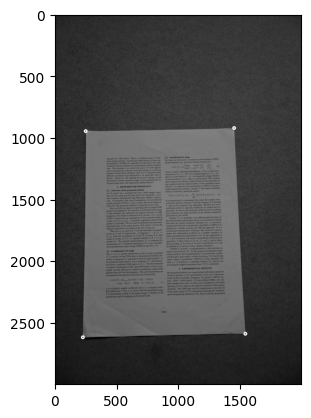

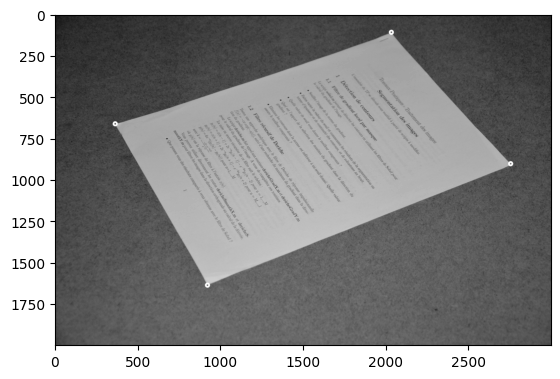

In [3]:
# Keypoints for img1. Should be a list in format [[first_point_row,first_point_column],
#                                                 [second_point_row,second_point_column],...]
pts1 = [[248,949],[1450,924],[1541,2592],[225,2621]] 

# Keypoints for img2,  keep the same order of the points as pts1.
pts2 = [[2030,110],[2750,904],[920,1638],[363,663]] 

# Below, we convert the points you found above into cv2 points object for vizualization 
# (no need to change anything)
kp1 = [cv2.KeyPoint(pt[0], pt[1], 1) for pt in pts1]
kp2 = [cv2.KeyPoint(pt[0], pt[1], 1) for pt in pts2]

for i in range(len(pts1)):
    img1c=cv2.circle(img1,pts1[i],radius=10,color=(255,0,0),thickness=10)
plt.figure(),plt.imshow(img1c,cmap='gray')

for i in range(len(pts2)):
    img2c=cv2.circle(img2,pts2[i],radius=10,color=(255,0,0),thickness=10)
plt.figure(),plt.imshow(img2c,cmap='gray')

# In all the following, we will use the convention that np.shape(pts1) = [2,number_of_points]
pts1 = np.array(pts1).T 

# In all the following, we will use the convention that np.shape(pts1) = [2,number_of_points]
pts2 = np.array(pts2).T 

**Visualize** the keypoints you found above to check that they are properly assigned.

Now, we will start implementing the DLT.

**Question:** recall what the DLT is. Give a pseudo code. What are its potential flaws and strengths?

**Answer:**

The Direct Linear Transformation (DLT) algorithm is a method used to estimate parameters of a geometric transformation, such as a homography, from a set of point correspondences. 

### DLT for Homography Estimation

The DLT algorithm for estimating a homography between two sets of points in two images works as follows:

1. **Input**: A set of at least 4 point correspondences $\{(x_i, y_i), (x'_i, y'_i)\}$ between two images.
2. **Normalization**: Normalize the coordinates of the points in both images. This involves translating and scaling the points so that the centroid of the points is at the origin (0,0) and the average distance to the origin is $\sqrt{2}$. This step is crucial for improving numerical stability and the accuracy of the estimation.
3. **Matrix Construction**: Construct a matrix $A$ based on the point correspondences. Each point correspondence contributes two rows to $A$, leading to a $2n \times 9$ matrix for $n$ correspondences.
4. **Solve for Homography**: Solve the equation $A \mathbf{h} = 0$ for the homography vector $\mathbf{h}$, where $\mathbf{h}$ is the flattened version of the homography matrix $H$. This is typically done using Singular Value Decomposition (SVD). The solution $\mathbf{h}$ corresponds to the eigenvector of $A^TA$ associated with the smallest eigenvalue.
5. **De-normalization**: Convert the estimated homography back to the original coordinate system using the normalization matrices applied in step 2.
6. **Output**: The homography matrix $H$ that best fits the given point correspondences.

### Pseudo Code

```plaintext
function estimateHomography(points1, points2):
    assert len(points1) == len(points2) >= 4
    
    # Normalize point sets
    normalizedPoints1, T1 = normalize(points1)
    normalizedPoints2, T2 = normalize(points2)
    
    # Construct matrix A
    A = constructMatrix(normalizedPoints1, normalizedPoints2)
    
    # Solve for homography
    U, S, Vt = SVD(A)
    h = Vt[-1]  # Last row of V^T corresponds to the smallest singular value
    H_normalized = reshape(h, (3, 3))
    
    # De-normalize the homography matrix
    H = inv(T2) @ H_normalized @ T1
    
    return H
```

### Strengths and Potential Flaws

**Strengths**:
- **Generality**: The DLT algorithm can be used to estimate a wide variety of geometric transformations, not just homographies.
- **Simplicity**: It is conceptually simple and straightforward to implement.
- **Efficiency**: It can be efficiently computed using standard linear algebra techniques.

**Potential Flaws**:
- **Sensitivity to Noise**: The accuracy of DLT can be significantly affected by measurement noise in the point correspondences. Small errors can lead to large inaccuracies in the estimated transformation.
- **Non-Robustness to Outliers**: DLT is sensitive to outliers. A single incorrect correspondence can significantly skew the estimated transformation. Robust estimation techniques like RANSAC are often used in conjunction with DLT to mitigate this issue.
- **Normalization is Crucial**: Proper normalization of the points is crucial for the stability and accuracy of the DLT. Failure to correctly normalize can lead to poor results.

The first step of the DLT algorithm is to normalize the image point.

**Question:** Recall why the normalization is important. Recall how to do it.

**Answer:**

### Importance of Normalization

1. **Improves Numerical Stability**: Coordinates of image points can have a wide range, especially in pixels. Operations on these values can lead to numerical instability in the computation of the homography. Normalization helps to bring these values into a smaller, more manageable range.
2. **Reduces Condition Number**: The condition number of a matrix indicates how an error in the input will be amplified in the output. Normalization helps to reduce the condition number of the matrices involved in the DLT algorithm, thereby making the solution more stable and less sensitive to small changes or errors in the input data.
3. **Uniform Scale**: It ensures that the scale of translations and rotations is uniform, which is particularly important when combining data from multiple sources or images with different resolutions or fields of view.
4. **Mitigates the Impact of Outliers**: By scaling the points so that they are centered around the origin and have a uniform average distance from the origin, normalization can also help in reducing the influence of outliers on the estimated homography.

### How to Normalize Image Points

The process of normalization involves translating and scaling the points so that their centroid is at the origin and their average distance from the origin is $\sqrt{2}$ (for 2D points):

1. **Calculate the Centroid**: Compute the mean of the x-coordinates and the y-coordinates separately to find the centroid of the set of points.
   $$
   \bar{x} = \frac{1}{n}\sum_{i=1}^{n}x_i, \quad \bar{y} = \frac{1}{n}\sum_{i=1}^{n}y_i
   $$

2. **Translate Points to the Origin**: Subtract the centroid from each point to translate the centroid of the points to the origin.
   $$
   x'_i = x_i - \bar{x}, \quad y'_i = y_i - \bar{y}
   $$

3. **Calculate the Average Distance**: Compute the average distance of the translated points from the origin.
   $$
   d_{avg} = \frac{1}{n}\sum_{i=1}^{n}\sqrt{{x'_i}^2 + {y'_i}^2}
   $$

4. **Scale the Points**: Scale the points so that their average distance from the origin is $\sqrt{2}$. The scale factor $s$ is $\sqrt{2}$ divided by the average distance $d_{avg}$.
   $$
   x''_i = x'_i \cdot \frac{\sqrt{2}}{d_{avg}}, \quad y''_i = y'_i \cdot \frac{\sqrt{2}}{d_{avg}}
   $$

5. **Normalization Matrix**: The normalization process can be represented by a normalization matrix $T$, which is used to transform the points. For the reverse transformation (de-normalization), the inverse of $T$ is used.

In the following, we will perform the normalization using the so called *homogeneous* coordinates of the keypoints. The main idea is to add a last coordinate equal to one for each point. The point (x,y) thus becomes (x,y,1) in homogeneous coordinate.

The advantage is that we will be able to do the normalization using a simple matrix product : X_norm = T@X.

**Fill** the blanks in the below implementation.

In [4]:
def normalize_image_points(imageEucl):
    """
    Input: 2D list with x,y image points
    Output: normalized data points
    """

    print("Normalizing data using similarity matrix...")

    # To be filled, (elementwise) mean and std of the data points
    mean, std = np.mean(imageEucl, axis=1), np.std(imageEucl, axis=1)
    
    # Image in homogeneous coordinate
    image = np.vstack((imageEucl, np.ones((1, imageEucl.shape[1]))))
    
    # Define a similarity matrix enabling to normalize the data. 
    # Write the cooefficients in Tranformation such that image_norm = image@Transformation
    Transformation = np.array([[std[0], 0,       mean[0]],
                               [0,      std[1],  mean[1]],
                               [0,        0,          1]])
    
    Transformation = np.linalg.inv(Transformation)

    # Apply transformation on data points
    image_norm = Transformation @ image
    
    # Retrieve normalized image in the original input shape (25, 2)
    image_norm = image_norm[0:2,:]

    return image_norm, Transformation

**Question:** Verify that your data looks properly normalized.

In [5]:
normalize_image_points(np.array(pts1))

Normalizing data using similarity matrix...


(array([[-0.98037024,  0.92643401,  1.07079273, -1.01685651],
        [-0.98490052, -1.01483671,  0.98250562,  1.0172316 ]]),
 array([[ 1.58635960e-03,  0.00000000e+00, -1.37378742e+00],
        [ 0.00000000e+00,  1.19744744e-03, -2.12127814e+00],
        [ 0.00000000e+00,  0.00000000e+00,  1.00000000e+00]]))

The second step is to compute the A matrix from the normalized data points.

**Fill** the blanks in the function below.

**Question:** justify the shape of the A matrix.

**Answer:**

From the linearized equations, each point correspondence contributes two rows to the $A$ matrix:

- The first row (for the $x'$ equation) places the $x, y,$ and 1 coordinates in the first three positions, followed by zeros, and then $-x'x, -x'y,$ and $-x'$ to account for the multiplication by $x'$ on the left-hand side.
- The second row (for the $y'$ equation) follows a similar pattern, with zeros in the first three positions, the $x, y,$ and 1 coordinates in the next three positions, and then $-y'x, -y'y,$ and $-y'$ to account for the multiplication by $y'$ on the left-hand side.

This results in a $2n \times 9$ matrix for $n$ point correspondences, where $n$ is at least 4 for homography estimation. The matrix $A$ is structured as follows:

$$
A = \begin{bmatrix}
-x & -y & -1 & 0 & 0 & 0 & xx' & xy' & x' \\
0 & 0 & 0 & -x & -y & -1 & yx' & yy' & y' \\
\vdots & \vdots & \vdots & \vdots & \vdots & \vdots & \vdots & \vdots & \vdots \\
\end{bmatrix}
$$

- The $2n \times 9$ shape of $A$ comes from having two equations (one for $x'$ and one for $y'$) for each of the $n$ correspondences, resulting in $2n$ rows.
- The 9 columns correspond to the flattened homography matrix $H$, which contains 8 independent parameters plus a scaling factor (the ninth parameter), since $H$ is a 3x3 matrix.

The structure of $A$ allows for solving the homography matrix $H$ using linear techniques, specifically by seeking a non-trivial solution to $A\mathbf{h} = 0$, where $\mathbf{h}$ is the vectorized form of $H$. This solution process typically involves Singular Value Decomposition (SVD) of $A$.

In [6]:
def compute_matrix_A(points1, points2, no_points):
    """
    Input: Already normalized correspondences for image1 and image2
    Output: Matrix A as defined in Zisserman p. 91
    """

    A = []

    for i in range(0, no_points):
        x, y = points1[0, i], points1[1, i] # Denote the coordinate in image 1 x and y for shortcut
        x_prime, y_prime = points2[0, i], points2[1, i] # Denote the coordinate in image 2 x_prime and y_prime for shortcut

        # Create A_i according to the fomula given in class
        # here we are assuming w_i and w_i_prime are one
        A.append([0, 0, 0, -x, -y, -1, y_prime*x, y_prime*y, y_prime])
        A.append([x, y, 1, 0, 0, 0, -x_prime*x, -x_prime*y, -x_prime])

    print()
    print("Stacked matrix A shape:", np.shape(A))

    return np.asarray(A)

We are now ready to code the whole homography computation function. 

**Fill** the gaps below.

In [7]:
def compute_homography(pts1,pts2):

    # Set data points to numpy arrays
    no_points = pts1.shape[1] # Number of points

    # Normalize the data
    image1_normalized, T = normalize_image_points(pts1)
    image2_normalized, T_prime = normalize_image_points(pts2)
    
    # Get matrix A
    A = compute_matrix_A(image1_normalized, image2_normalized, no_points)

    # Compute SVD of A
    U, S, V = np.linalg.svd(A)
    V = V.T # So that A = USV.T
    
    # Get last column of V (this is the vector h)
    h = V[:,-1]
    
    # Obtain homography by reshaping h (H tilde)
    print()
    print("Reshaping to get homography H_tilde...")
    H_tilde = h.reshape(3,3)

    # Denormalize to obtain homography (H) using the transformations and generalized pseudo-inverse
    H = np.linalg.inv(T_prime) @ H_tilde @ T

    print()
    print("Denormalized to obtain homography H for 2D data points...")
    print("Matrix H:")
    print(H)
    
    return H

**Question:** Apply the compute_homography function to warp the document image 2 into the perspective of document 1. Any comment ?

Normalizing data using similarity matrix...
Normalizing data using similarity matrix...

Stacked matrix A shape: (8, 9)

Reshaping to get homography H_tilde...

Denormalized to obtain homography H for 2D data points...
Matrix H:
[[ 1.89756456e-01 -6.18024327e-01  1.80016938e+03]
 [ 3.58876320e-01  2.07702314e-01 -2.17795736e+02]
 [-6.16994599e-05 -4.83098365e-06  6.40932323e-01]]


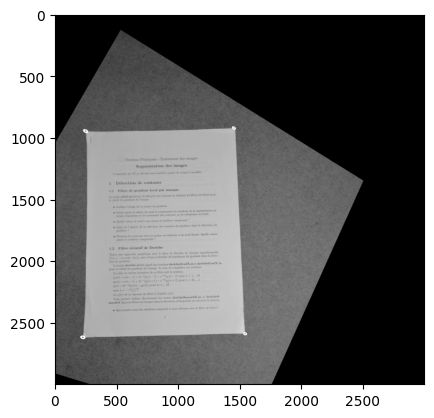

In [8]:
H = compute_homography(pts1,pts2)
homography_matrix_normalized = H
result = cv2.warpPerspective(img2, np.linalg.inv(homography_matrix_normalized),(3000,3000))
plt.imshow(result,cmap='gray')

**Answer:**

The image shows img2, which has been warped to match the perspective of img1. The document in img2 appears to be seen from a similar perspective to that of img1, as intended by the homography transformation.

However, there is a noticeable black portion on the right side and bottom of the document that was not present in the original img2. This black area is likely due to the warping process and represents parts of the transformed image where the new perspective extends beyond the bounds of the original image. These regions do not have corresponding pixels in img2, hence they are filled with the default value.

This artifact can occur when the homography matrix extrapolates the coordinates of some points in img2 to locations outside its original dimensions. When `cv2.warpPerspective` applies the transformation matrix, it must handle these out-of-bounds regions. Since there is no image data from img2 that corresponds to these regions, they are left black.

**Question:** test the sensitivity of the above algorithm to errors in the matching keypoints. Are you able to obtain good results if you have a false match?

Answer to the same question is you have more matching points than the corners.

**Answer:**

Normalizing data using similarity matrix...
Normalizing data using similarity matrix...

Stacked matrix A shape: (8, 9)

Reshaping to get homography H_tilde...

Denormalized to obtain homography H for 2D data points...
Matrix H:
[[ 2.35196096e-01 -9.73248914e-01  2.49796628e+03]
 [ 4.55908436e-01 -4.66414728e-02  1.96679023e+01]
 [-8.64194355e-05 -1.98067676e-04  1.01367494e+00]]


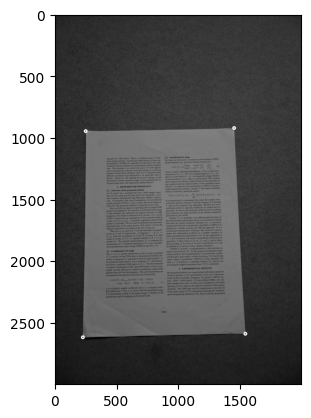

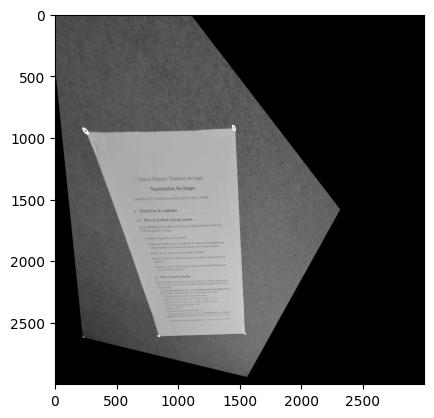

In [9]:
pts1 = [[248,949],[1450,924],[1541,2592],[225,2621]]
pts2 = [[2030,110],[2750,904],[920,1638],[0,0]]

for i in range(len(pts1)):
    img1c_dec=cv2.circle(img1,pts1[i],radius=10,color=(255,0,0),thickness=10)
plt.figure(),plt.imshow(img1c_dec,cmap='gray')

for i in range(len(pts2)):
    img2c_dec=cv2.circle(img2,pts2[i],radius=10,color=(255,0,0),thickness=10)
plt.figure(),plt.imshow(img2c_dec,cmap='gray')

pts1 = np.array(pts1).T # In all the following, we will use the convention that np.shape(pts1) = [2xnumber_of_points]
pts2 = np.array(pts2).T # In all the following, we will use the convention that np.shape(pts1) = [2xnumber_of_points

H = compute_homography(pts1,pts2)
homography_matrix_normalized = H / H[2, 2]
result = cv2.warpPerspective(img2, np.linalg.inv(homography_matrix_normalized),(3000,3000))
plt.imshow(result,cmap='gray')

The algorithm for computing a homography is highly sensitive to the accuracy of the matching keypoints between the two images. A homography relies on correct correspondences to calculate the perspective transformation matrix that maps one image onto the other. If there is a false match or outlier among the point correspondences, it can significantly skew the result, leading to an incorrect homography and a poorly warped image.

- **Without Robust Estimation**: the presence of a false match resulted in a visible distortion or misalignment in the warped image. The transformation was notaccurate, leading to bends, stretches, and skewing in parts of the image that should remain rectilinear, such as the edges of the document.

Normalizing data using similarity matrix...
Normalizing data using similarity matrix...

Stacked matrix A shape: (10, 9)

Reshaping to get homography H_tilde...

Denormalized to obtain homography H for 2D data points...
Matrix H:
[[ 6.45162502e-01 -7.58763220e-01  1.66046707e+03]
 [ 6.12246123e-01  1.68062064e-01 -3.52433817e+02]
 [ 1.58999873e-04 -6.34247978e-05  5.42543517e-01]]


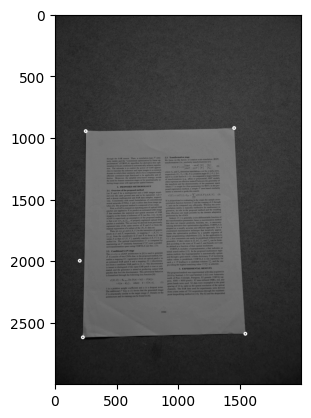

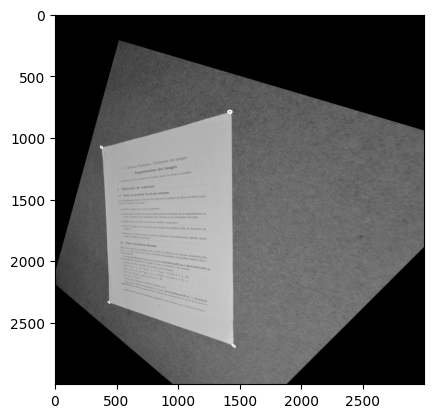

In [10]:
# Using more matching points
pts3 = [[248,949], [1450,924], [1541,2592], [200,2000], [225,2621]]
pts4 = [[2030,110],[2750,904], [920,1638],  [0,0],      [363,663]]

for i in range(len(pts3)):
    img1c_dec=cv2.circle(img1,pts3[i],radius=10,color=(255,0,0),thickness=10)
plt.figure(),plt.imshow(img1c_dec,cmap='gray')

for i in range(len(pts4)):
    img2c_dec = cv2.circle(img2,pts4[i],radius=10,color=(255,0,0),thickness=10)
plt.figure(),plt.imshow(img2c_dec,cmap='gray')

pts3 = np.array(pts3).T # In all the following, we will use the convention that np.shape(pts1) = [2xnumber_of_points]
pts4 = np.array(pts4).T # In all the following, we will use the convention that np.shape(pts1) = [2xnumber_of_points

H = compute_homography(pts3,pts4)
homography_matrix_normalized = H / H[2, 2]
result = cv2.warpPerspective(img2, np.linalg.inv(homography_matrix_normalized),(3000,3000))
plt.imshow(result,cmap='gray')

As among the additional points there are false matches, and this is not a robust method like RANSAC to exclude outliers, these incorrect matches could severely affect the homography calculation. Adding more points does not inherently improve the result if these additional points are not accurate correspondences.

The severe distortion indicates that the matching keypoints included multiple incorrect matches and that the matching algorithm did not appropriately handle outliers. 

# Part 2: automatic homography estimation and panorama stitching

To bypass the flaws that we observed with the previous method, we now propose to use a robust homography estimation method, the RANSAC algorithm. As an application, we will consider panorama stitching: from two given overlapping images, create a single one which is a panorama. To do that, we will need to estimate the best homography to warp an image into the perspective of the other. In addition, to avoid the cumbersome choice of the matching points between the two images, we will do an automatic keypoint identification by using the SIFT features.

Let us first load the two considered images.

(<Figure size 640x480 with 1 Axes>,
 <matplotlib.image.AxesImage at 0x2873f93f350>)

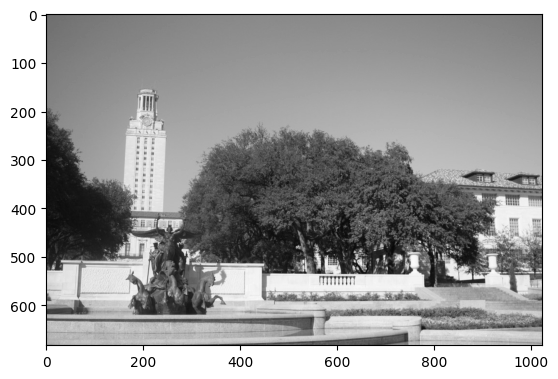

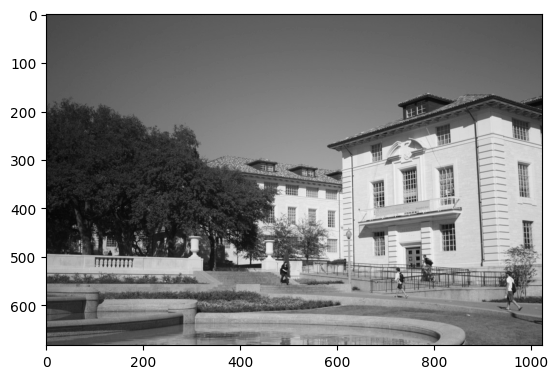

In [11]:
img1c = cv2.cvtColor(cv2.imread('uttower_left.jpg'),cv2.COLOR_BGR2GRAY)
img2c = cv2.cvtColor(cv2.imread('uttower_right.jpg'),cv2.COLOR_BGR2GRAY)

img1 = img1c
img2 = img2c

plt.figure(),plt.imshow(img1,cmap='gray')
plt.figure(),plt.imshow(img2,cmap='gray')

To stitch the two images, we need to have access to pair of corresponding points between image 1 and image 2. To do that, we first need to extract some keypoints in both images (that will be matched later on). We will use here the SIFT descriptors.

**Implement** the SIFT descriptors for both image 1 and image 2. You might be willing to use the cv2.SIFT_create and sift.detectAndCompute.

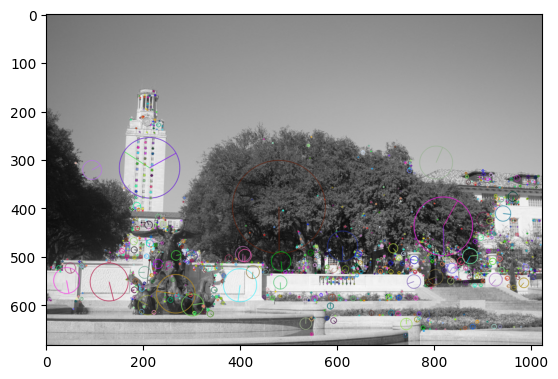

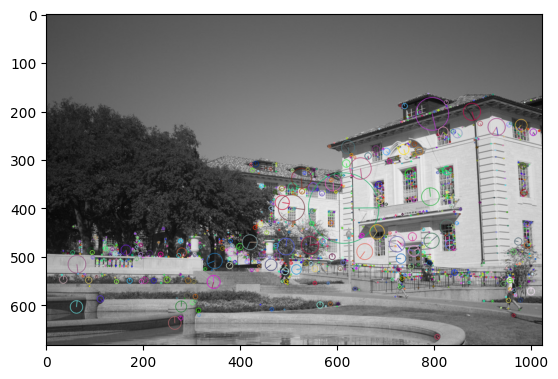

In [12]:
# Creates an object of the SIFT class. The larger the threshold, the smaller the number of points
sift = cv2.SIFT_create(contrastThreshold = 0.1)

#kp1 = location of the keypoints, desc1 = corresponding descriptors.
kp1, desc1 = sift.detectAndCompute(img1, None)

# For visualization
img1c=cv2.drawKeypoints(img1,kp1,img1c,flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
plt.imshow(img1c)
plt.show()

#kp2 = location of the keypoints, desc2 = corresponding descriptors.
kp2,desc2 = sift.detectAndCompute(img2, None) 
img2c=cv2.drawKeypoints(img2,kp2,img2c,flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
plt.imshow(img2c)

**Question:** explain the shapes of desc1, kp1 and desc2, kp2 and their respective roles.

**Answer:**

### `kp1` and `kp2`
- `kp1` and `kp2` are lists of keypoints detected in `img1` and `img2`, respectively. 
- A keypoint is a data structure containing the location of a feature (x, y coordinates within the image), the scale at which the feature was found, the orientation, and possibly other information that describes the feature at that keypoint.
- The shape of `kp1` and `kp2` is not an array shape but rather the number of detected keypoints. It's a list where each element is a `cv2.KeyPoint` object.

### `desc1` and `desc2`
- `desc1` and `desc2` are NumPy arrays containing the descriptors corresponding to the keypoints in `img1` and `img2`, respectively. 
- A descriptor is a vector that describes the image patch surrounding the keypoint in a way that aims to be invariant to scale, rotation, and (to some extent) changes in illumination.
- The shape of `desc1` and `desc2` arrays is typically `(n, 128)`, where `n` is the number of keypoints detected in the image, and `128` is the length of the SIFT descriptor for each keypoint.

### Keypoints and Descriptors
- **Keypoints (`kp1`, `kp2`)**: The role of the keypoints is to provide a set of points in each image that are characteristic and recognizable, even under different transformations such as scaling or rotation. These points serve as reference markers for aligning images and matching features between different views of the same scene or object.
- **Descriptors (`desc1`, `desc2`)**: The role of the descriptors is to provide a unique fingerprint for each keypoint that can be used to match keypoints between different images. By comparing descriptors from `desc1` and `desc2`, one can determine which keypoints from `img1` correspond to keypoints in `img2`. This matching process is critical for tasks such as image stitching, object recognition, 3D reconstruction, and motion tracking.

Now that we have obtained the SIFT descriptor, we have to match them.

**Complete** the following code.

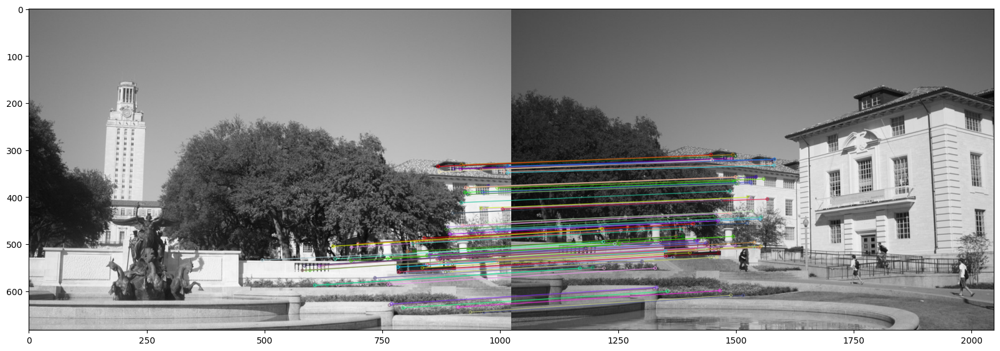

(<Figure size 2000x1200 with 1 Axes>,
 None)

In [13]:
#feature matching
bf = cv2.BFMatcher(cv2.NORM_L1, crossCheck=True)

matches = bf.match(desc1,desc2) # Match descriptors.
matches = sorted(matches, key = lambda x:x.distance) # Sort matches based on feature distance.

# For visualizing the matches
img3 = cv2.drawMatches(img1, kp1, img2, kp2, matches[:100], img2, flags=2)
plt.figure(figsize=(20,12)),plt.imshow(img3),plt.show()

**Question:** comment the match quality. Do you think that the previous matching would enable a decent homography computation using the DLT algorithm of the first part?

**Answer:**

1. **Correctness of Matches**: The quality of the homography depends significantly on the correctness of the matches. As the matches correctly correspond to the same physical points in the two scenes, then they can be used to compute a homography.

2. **Distribution of Matches**: Ideally, the matches should be well-distributed across the entire scene and not clustered in a small region. This ensures that the computed homography accounts for the perspective distortion throughout the image.

3. **Outliers**: It is also important that there are not many outliers (incorrect matches) because they can significantly distort the computed homography. If outliers are present, a robust method like RANSAC should be used in conjunction with DLT to minimize their impact.

4. **Number of Matches**: There should be at least four pairs of matches to compute a homography. However, having more than four pairs is generally better as it can provide a more accurate estimate, particularly if a method like RANSAC is used to filter out outliers.

From the lines drawn in the image, it's likely that a decent homography could be computed. 

The following code enables to keep only the coordinates of the 100 best matches in the two images. We will use them as an input of a RANSAC, which will enable to do a robust homography estimation between the two images.

In [14]:
D1 = np.ones((2,100)) # Coordinates in image 1 of the first best matching points
D2 = np.ones((2,100)) # Coordinates in image 2 of the first best matching points
for ii in range(100):
    D1[:,ii] = kp1[matches[ii].queryIdx].pt
    D2[:,ii] = kp2[matches[ii].trainIdx].pt

D1 = D1.astype(int)
D2 = D2.astype(int)

In [15]:
print(D1.shape)

(2, 100)


Now, we are ready to code the RANSAC algorithm.

**Fill** the gaps in the code below.

In [16]:
def ransac(D1, D2, num, threshold, iterations):
    # D1, D2 : matched points between the two images
    # num : number of points to compute the homography
    # threshold : distance threshold for determining if a pair of point in an inlier or an outlier
    # iterations : number of iterations / number of sampling
    
    # D1h correspond to D1 transformed into homogeneous coordinates
    D1h = np.ones((3,100))
    D1h[0:2,:] = D1
    
    # D2h correspond to D2 transformed into homogeneous coordinates
    D2h = np.ones((3,100))
    D2h[0:2,:] = D2
        
    n = D1.shape[1] # Number of points in D1

    best_n_inlier = 0

    # Best homography matrix. Fill the gap with a matrix of the right size full of 0.
    best_H = np.zeros((3,3))
    
    for i in range(iterations):
        # Draw randomly 4 indices to extract 4 points among D1 and D2. You can use np.random.choice()
        s = np.random.choice(n, num, replace=False)
        
        pts1 =  D1[:, s] #pts1 is the chosen points among D1
        pts2 =  D2[:, s] #pts2 is the chosen points among D2
        
        # Compute the corresponding homography. You can reuse the function of part I.
        H = compute_homography(pts1,pts2)
        
        D2_new = np.dot(H, D1h) # Transform the points of D1h to be able to compare them to the ones of D2h
        
        # Normalize D2_new
        D2_new[0, :] = np.divide(D2_new[0, :],D2_new[2, :])
        D2_new[1, :] = np.divide(D2_new[1, :],D2_new[2, :])
        D2_new[2, :] = np.divide(D2_new[2, :],D2_new[2, :])
        
        # Compute the distance between D2_new and D2h
        SD = np.sqrt(np.sum((D2h - D2_new)**2, axis=0))
        
        # Compute the inliers
        inliers = np.where(SD < threshold)[0] 

        # Compute the number of inliers
        num_inlier = len(inliers)
        
        if num_inlier > best_n_inlier: # If you obtained the best result, store the corresponding homography
            best_H = H
            best_n_inlier = num_inlier
            point1 = D1[:2, inliers]
            point2 = D2[:2, inliers]
            in_res = SD[inliers]
    
    return best_H, best_n_inlier, point1, point2, in_res

Using the function you implemented above, **launch the RANSAC algorithm** to estimate the homography between the two images.

In [17]:
threshold = 1
num = 4
iterations = 1000
[H, inliers, point1, point2, residue] = ransac(D1, D2, num,threshold, iterations)

Normalizing data using similarity matrix...
Normalizing data using similarity matrix...

Stacked matrix A shape: (8, 9)

Reshaping to get homography H_tilde...

Denormalized to obtain homography H for 2D data points...
Matrix H:
[[ 5.78737969e-01 -8.72748882e-02 -2.26674138e+02]
 [ 7.16612685e-02  5.19352137e-01 -5.61975020e+01]
 [ 1.03436400e-04 -1.00395115e-04  5.24146028e-01]]
Normalizing data using similarity matrix...
Normalizing data using similarity matrix...

Stacked matrix A shape: (8, 9)

Reshaping to get homography H_tilde...

Denormalized to obtain homography H for 2D data points...
Matrix H:
[[ 1.11766570e+00  5.51645385e+00 -3.63955648e+03]
 [ 9.53796603e-01  6.63949438e+00 -4.01523204e+03]
 [ 1.86612675e-03  1.29822980e-02 -7.84991081e+00]]
Normalizing data using similarity matrix...
Normalizing data using similarity matrix...

Stacked matrix A shape: (8, 9)

Reshaping to get homography H_tilde...

Denormalized to obtain homography H for 2D data points...
Matrix H:
[[ 3.

C:\Users\lmcastanedame\AppData\Local\Temp\ipykernel_17936\2463341304.py:35: RuntimeWarning: divide by zero encountered in divide
  D2_new[0, :] = np.divide(D2_new[0, :],D2_new[2, :])
C:\Users\lmcastanedame\AppData\Local\Temp\ipykernel_17936\2463341304.py:36: RuntimeWarning: divide by zero encountered in divide
  D2_new[1, :] = np.divide(D2_new[1, :],D2_new[2, :])
C:\Users\lmcastanedame\AppData\Local\Temp\ipykernel_17936\2463341304.py:37: RuntimeWarning: invalid value encountered in divide
  D2_new[2, :] = np.divide(D2_new[2, :],D2_new[2, :])
C:\Users\lmcastanedame\AppData\Local\Temp\ipykernel_17936\2463341304.py:35: RuntimeWarning: invalid value encountered in divide
  D2_new[0, :] = np.divide(D2_new[0, :],D2_new[2, :])
C:\Users\lmcastanedame\AppData\Local\Temp\ipykernel_17936\2463341304.py:36: RuntimeWarning: invalid value encountered in divide
  D2_new[1, :] = np.divide(D2_new[1, :],D2_new[2, :])


Normalizing data using similarity matrix...
Normalizing data using similarity matrix...

Stacked matrix A shape: (8, 9)

Reshaping to get homography H_tilde...

Denormalized to obtain homography H for 2D data points...
Matrix H:
[[ 6.16454180e-01 -9.16582953e-02 -2.42072072e+02]
 [ 8.62250599e-02  5.03829535e-01 -4.44693497e+01]
 [ 1.47731986e-04 -1.18906973e-04  5.30973251e-01]]
Normalizing data using similarity matrix...
Normalizing data using similarity matrix...

Stacked matrix A shape: (8, 9)

Reshaping to get homography H_tilde...

Denormalized to obtain homography H for 2D data points...
Matrix H:
[[ 6.28426246e-01  1.16136606e-01 -3.64336106e+02]
 [ 1.43703554e-01  7.48207150e-01 -2.26427650e+02]
 [ 2.65136047e-04  4.10660906e-04  1.43122387e-01]]
Normalizing data using similarity matrix...
Normalizing data using similarity matrix...

Stacked matrix A shape: (8, 9)

Reshaping to get homography H_tilde...

Denormalized to obtain homography H for 2D data points...
Matrix H:
[[ 7.

In [18]:
print(H)

[[ 6.04092417e-01 -3.27760479e-02 -2.67300030e+02]
 [ 7.59892959e-02  5.70316766e-01 -7.63522446e+01]
 [ 1.24578486e-04  1.30485642e-05  4.69442223e-01]]


Lastly, **fill the code** below to warp img2 into the same space as img1

In [19]:
param1 = np.linalg.inv(H) / np.linalg.inv(H)[2, 2]
result = cv2.warpPerspective(img2, param1, (img1.shape[1] + img2.shape[1], img1.shape[0]))
result[0:img1.shape[0], 0:img1.shape[1]] = img1

**Question:** Plot the panorama image. How good is it? Any comment?

(<Figure size 4000x2000 with 1 Axes>,
 <matplotlib.image.AxesImage at 0x287388eb910>)

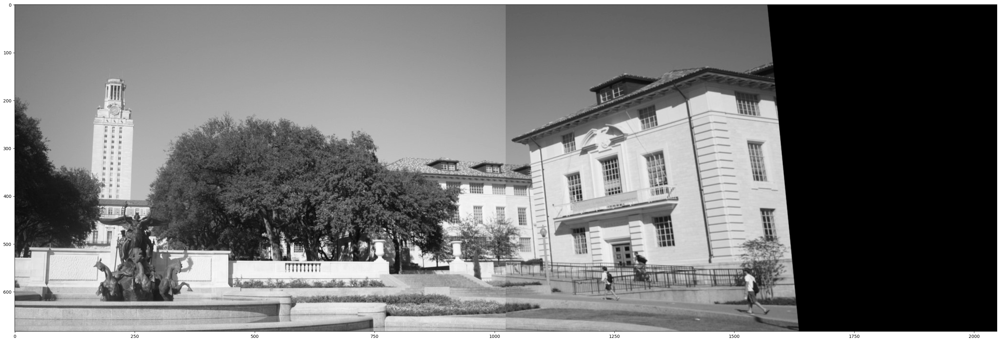

In [20]:
plt.figure(figsize=(40,20)),plt.imshow(result,cmap='gray')

The panorama image appears to show two photographs that have been placed side by side to form a wider view of the scene. From the grayscale values and seamless edges where the images meet:

1. **Alignment**: The alignment of the two images looks quite good at first glance. The transition between the images does not show any abrupt changes in the grayscale intensity, which suggests that the blending has been handled well. This is a positive indicator of a successful panorama stitch.

2. **Seam Visibility**: If there are any seams visible, they are not immediately apparent in the black and white rendition you've shown. This suggests that the overlapping regions between the images have been blended effectively.

3. **Perspective Consistency**: It is important that the perspectives in the two images are consistent for a realistic panorama. Any misalignments in perspective would be noticeable where the images meet, but this does not seem to be the case here.

4. **Geometric Distortion**: There does not appear to be significant geometric distortion at the stitch line, which suggests that the homography used to warp the images has been calculated accurately.

5. **Exposure and Lighting**: The exposure levels between the two images is not consistent, if the exposures are not matched, one image looks noticeably darker.

**Bonus**: try other descriptors than the SIFT ones. Try to implement your own.

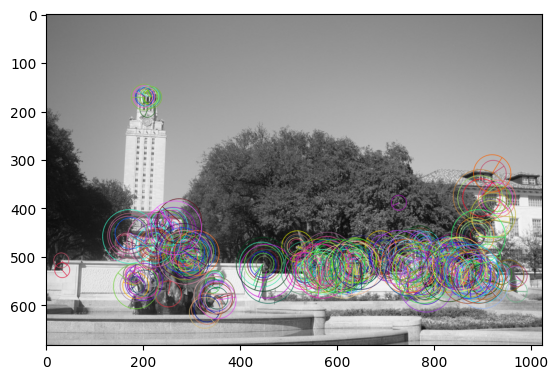

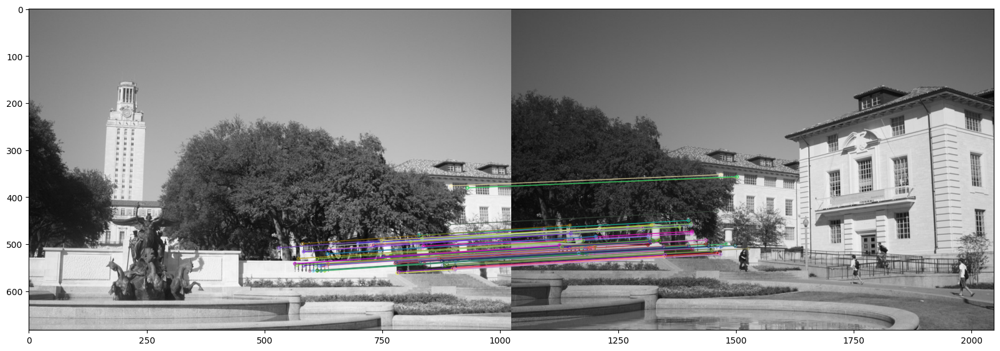

Normalizing data using similarity matrix...
Normalizing data using similarity matrix...

Stacked matrix A shape: (8, 9)

Reshaping to get homography H_tilde...

Denormalized to obtain homography H for 2D data points...
Matrix H:
[[-1.29189350e+00 -4.35501297e+01  2.44260394e+04]
 [-2.28520002e+00 -6.25498985e+01  3.54213301e+04]
 [-4.55583131e-03 -1.24965764e-01  7.07582779e+01]]
Normalizing data using similarity matrix...
Normalizing data using similarity matrix...

Stacked matrix A shape: (8, 9)

Reshaping to get homography H_tilde...

Denormalized to obtain homography H for 2D data points...
Matrix H:
[[ 7.43177049e-01 -7.04448777e-01  1.43811575e+01]
 [ 3.51332024e-01 -5.10275537e-01  3.35927068e+02]
 [ 6.65999126e-04 -2.12172206e-03  1.28621072e+00]]
Normalizing data using similarity matrix...
Normalizing data using similarity matrix...

Stacked matrix A shape: (8, 9)

Reshaping to get homography H_tilde...

Denormalized to obtain homography H for 2D data points...
Matrix H:
[[ 6.

C:\Users\lmcastanedame\AppData\Local\Temp\ipykernel_17936\2463341304.py:35: RuntimeWarning: divide by zero encountered in divide
  D2_new[0, :] = np.divide(D2_new[0, :],D2_new[2, :])
C:\Users\lmcastanedame\AppData\Local\Temp\ipykernel_17936\2463341304.py:35: RuntimeWarning: invalid value encountered in divide
  D2_new[0, :] = np.divide(D2_new[0, :],D2_new[2, :])
C:\Users\lmcastanedame\AppData\Local\Temp\ipykernel_17936\2463341304.py:36: RuntimeWarning: divide by zero encountered in divide
  D2_new[1, :] = np.divide(D2_new[1, :],D2_new[2, :])
C:\Users\lmcastanedame\AppData\Local\Temp\ipykernel_17936\2463341304.py:37: RuntimeWarning: invalid value encountered in divide
  D2_new[2, :] = np.divide(D2_new[2, :],D2_new[2, :])



Reshaping to get homography H_tilde...

Denormalized to obtain homography H for 2D data points...
Matrix H:
[[ 3.12388988e-01  3.93006710e+00 -2.14494329e+03]
 [-2.33852309e-01  5.06778122e+00 -2.22554615e+03]
 [-4.63589691e-04  8.64268039e-03 -3.65897843e+00]]
Normalizing data using similarity matrix...
Normalizing data using similarity matrix...

Stacked matrix A shape: (8, 9)

Reshaping to get homography H_tilde...

Denormalized to obtain homography H for 2D data points...
Matrix H:
[[ 5.08866114e-01 -1.80939382e-01 -1.34110313e+02]
 [-1.50632001e-01  9.07795548e-02  3.06540679e+02]
 [-3.66950593e-04 -9.90887073e-04  1.28226504e+00]]
Normalizing data using similarity matrix...
Normalizing data using similarity matrix...

Stacked matrix A shape: (8, 9)

Reshaping to get homography H_tilde...

Denormalized to obtain homography H for 2D data points...
Matrix H:
[[ 5.94049912e-01  7.51731296e-01 -6.88605505e+02]
 [ 6.39501137e-03  2.12170580e+00 -8.69107282e+02]
 [-7.70744855e-06  3.03

C:\Users\lmcastanedame\AppData\Local\Temp\ipykernel_17936\2463341304.py:36: RuntimeWarning: invalid value encountered in divide
  D2_new[1, :] = np.divide(D2_new[1, :],D2_new[2, :])


Normalizing data using similarity matrix...
Normalizing data using similarity matrix...

Stacked matrix A shape: (8, 9)

Reshaping to get homography H_tilde...

Denormalized to obtain homography H for 2D data points...
Matrix H:
[[-7.60442125e-01  4.26004177e+00 -1.68856656e+03]
 [-1.84459049e+00  1.10409773e+01 -4.45488893e+03]
 [-3.95358494e-03  2.37979127e-02 -9.61540454e+00]]
Normalizing data using similarity matrix...
Normalizing data using similarity matrix...

Stacked matrix A shape: (8, 9)

Reshaping to get homography H_tilde...

Denormalized to obtain homography H for 2D data points...
Matrix H:
[[ 3.13406093e-01 -7.18867637e-01  2.84852935e+02]
 [-4.08870355e-01 -3.18048603e-01  7.26414205e+02]
 [-8.45617013e-04 -1.83570900e-03  2.11687612e+00]]
Normalizing data using similarity matrix...
Normalizing data using similarity matrix...

Stacked matrix A shape: (8, 9)

Reshaping to get homography H_tilde...

Denormalized to obtain homography H for 2D data points...
Matrix H:
[[ 3.

(<Figure size 4000x2000 with 1 Axes>,
 <matplotlib.image.AxesImage at 0x2873f9b9350>)

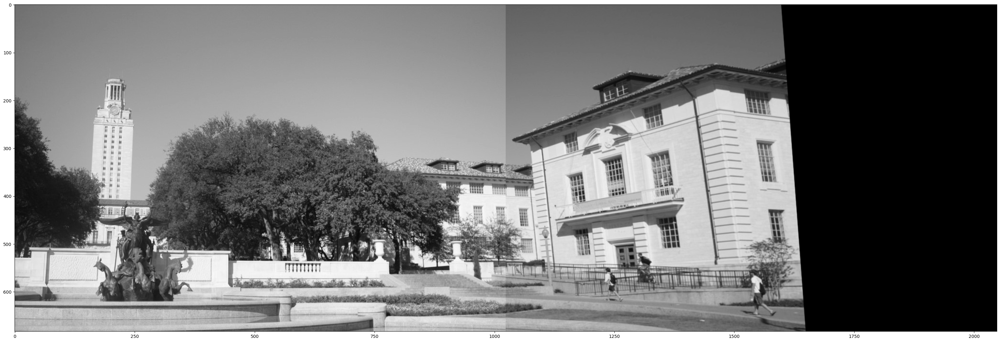

In [21]:
# Try other descriptors than SIFT
# ORB
orb = cv2.ORB_create()
kp1, desc1 = orb.detectAndCompute(img1, None)
kp2, desc2 = orb.detectAndCompute(img2, None)

# For visualization
img1c = cv2.drawKeypoints(img1, kp1, img1c, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
plt.imshow(img1c)
plt.show()

#feature matching
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)

matches = bf.match(desc1, desc2) # Match descriptors.
matches = sorted(matches, key = lambda x:x.distance) # Sort matches based on feature distance.

# For visualizing the matches
img3 = cv2.drawMatches(img1, kp1, img2, kp2, matches[:100], img2, flags=2)
plt.figure(figsize=(20,12)),plt.imshow(img3),plt.show()

D1 = np.ones((2,100)) # Coordinates in image 1 of the first best matching points
D2 = np.ones((2,100)) # Coordinates in image 2 of the first best matching points
for ii in range(100):
    D1[:,ii] = kp1[matches[ii].queryIdx].pt
    D2[:,ii] = kp2[matches[ii].trainIdx].pt

D1 = D1.astype(int)
D2 = D2.astype(int)

threshold = 1
num = 4
iterations = 1000
[H, inliers, point1, point2, residue] = ransac(D1, D2, num,threshold, iterations)

print(H)

param1 = np.linalg.inv(H) / np.linalg.inv(H)[2, 2]
result = cv2.warpPerspective(img2, param1, (img1.shape[1] + img2.shape[1], img1.shape[0]))
result[0:img1.shape[0], 0:img1.shape[1]] = img1

plt.figure(figsize=(40,20)),plt.imshow(result,cmap='gray')


**Bonus:** try to correct the change of luminosity between the two images so that the panorama look more realistic.

In [22]:
# Correct the luminosity between the two images so the panorama is more realistic
img1 = cv2.imread('uttower_left.jpg')
img2 = cv2.imread('uttower_right.jpg')

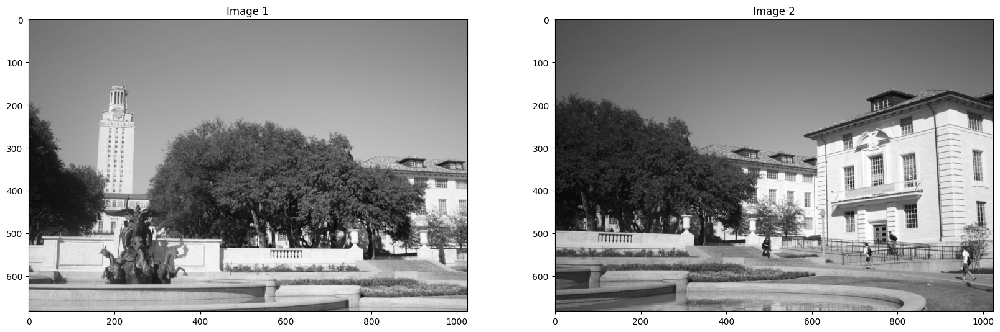

In [23]:
def calculate_brightness(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    return np.mean(gray)

def adjust_brightness_and_contrast(source_image, target_brightness):
    source_brightness = calculate_brightness(source_image)
    brightness_difference = target_brightness - source_brightness
    corrected_image = np.clip(source_image + brightness_difference, 0, 255).astype(np.uint8)
    return corrected_image

brightness1 = calculate_brightness(img1)
brightness2 = calculate_brightness(img2)

adjusted_image2 = adjust_brightness_and_contrast(img2, brightness1)

img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
img2 = cv2.cvtColor(adjusted_image2, cv2.COLOR_BGR2GRAY)

# Plot the images
plt.figure(figsize=(20, 10))
plt.subplot(1, 2, 1)
plt.imshow(img1, cmap='gray')
plt.title('Image 1')
plt.subplot(1, 2, 2)
plt.imshow(img2, cmap='gray')
plt.title('Image 2')
plt.show()

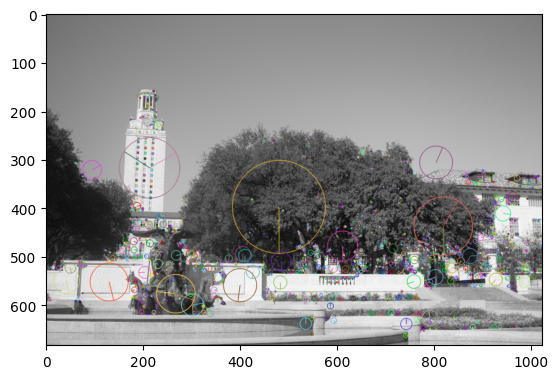

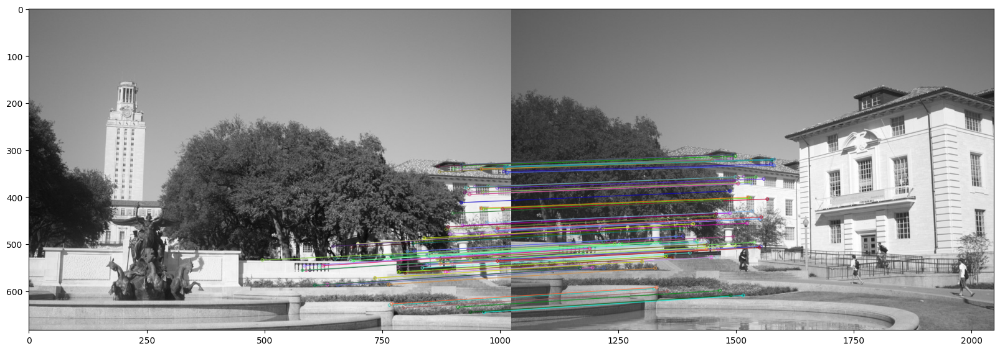

Normalizing data using similarity matrix...
Normalizing data using similarity matrix...

Stacked matrix A shape: (8, 9)

Reshaping to get homography H_tilde...

Denormalized to obtain homography H for 2D data points...
Matrix H:
[[ 9.06125735e-01  4.01527330e-01 -7.48338521e+02]
 [ 4.68660010e-01  1.01936812e+00 -6.43198978e+02]
 [ 8.96579044e-04  9.85860967e-04 -6.93368275e-01]]
Normalizing data using similarity matrix...
Normalizing data using similarity matrix...

Stacked matrix A shape: (8, 9)

Reshaping to get homography H_tilde...

Denormalized to obtain homography H for 2D data points...
Matrix H:
[[-9.51309959e-01 -8.65304512e-01  1.46883589e+03]
 [-1.87099189e+00 -5.96078273e-01  2.16140794e+03]
 [-4.10925178e-03 -2.32231865e-03  5.23296937e+00]]
Normalizing data using similarity matrix...
Normalizing data using similarity matrix...

Stacked matrix A shape: (8, 9)

Reshaping to get homography H_tilde...

Denormalized to obtain homography H for 2D data points...
Matrix H:
[[ 4.

C:\Users\lmcastanedame\AppData\Local\Temp\ipykernel_17936\2463341304.py:35: RuntimeWarning: divide by zero encountered in divide
  D2_new[0, :] = np.divide(D2_new[0, :],D2_new[2, :])
C:\Users\lmcastanedame\AppData\Local\Temp\ipykernel_17936\2463341304.py:36: RuntimeWarning: divide by zero encountered in divide
  D2_new[1, :] = np.divide(D2_new[1, :],D2_new[2, :])
C:\Users\lmcastanedame\AppData\Local\Temp\ipykernel_17936\2463341304.py:37: RuntimeWarning: invalid value encountered in divide
  D2_new[2, :] = np.divide(D2_new[2, :],D2_new[2, :])



Reshaping to get homography H_tilde...

Denormalized to obtain homography H for 2D data points...
Matrix H:
[[ 7.64228786e-01 -9.39156432e-01  9.81463062e+01]
 [ 2.51032001e-01 -9.69447748e-01  6.14561038e+02]
 [ 4.41891046e-04 -2.89966346e-03  1.79284538e+00]]
Normalizing data using similarity matrix...
Normalizing data using similarity matrix...

Stacked matrix A shape: (8, 9)

Reshaping to get homography H_tilde...

Denormalized to obtain homography H for 2D data points...
Matrix H:
[[ 6.18164754e-01 -4.51001772e-02 -2.75038742e+02]
 [ 1.02919939e-01  5.60516515e-01 -9.78748571e+01]
 [ 1.77541430e-04 -6.60561081e-06  4.28391492e-01]]
Normalizing data using similarity matrix...
Normalizing data using similarity matrix...

Stacked matrix A shape: (8, 9)

Reshaping to get homography H_tilde...

Denormalized to obtain homography H for 2D data points...
Matrix H:
[[ 5.92029043e-01 -4.24316963e-03 -2.74999781e+02]
 [ 7.54281083e-02  5.76749752e-01 -8.37519964e+01]
 [ 1.29214338e-04  6.12

(<Figure size 4000x2000 with 1 Axes>,
 <matplotlib.image.AxesImage at 0x2874417ead0>)

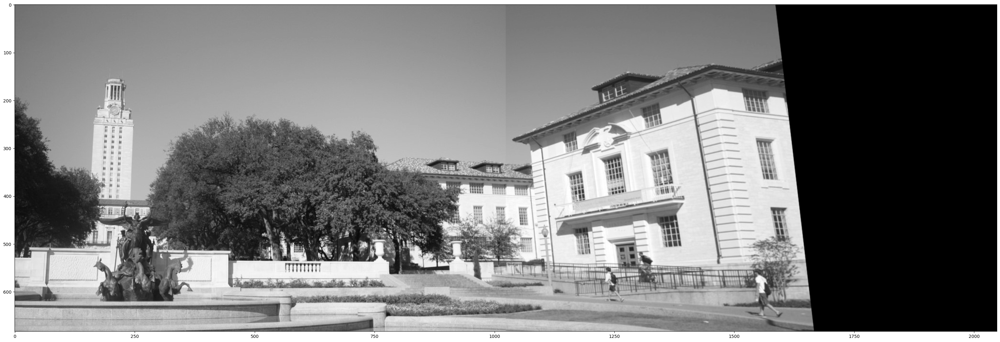

In [24]:
# Creates an object of the SIFT class. The larger the threshold, the smaller the number of points
sift = cv2.SIFT_create(contrastThreshold = 0.1)

#kp1 = location of the keypoints, desc1 = corresponding descriptors.
kp1, desc1 = sift.detectAndCompute(img1, None)

# For visualization
img1c=cv2.drawKeypoints(img1,kp1,img1c,flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
plt.imshow(img1c)
plt.show()

#kp2 = location of the keypoints, desc2 = corresponding descriptors.
kp2,desc2 = sift.detectAndCompute(img2, None)

#feature matching
bf = cv2.BFMatcher(cv2.NORM_L1, crossCheck=True)

matches = bf.match(desc1,desc2) # Match descriptors.
matches = sorted(matches, key = lambda x:x.distance) # Sort matches based on feature distance.

# For visualizing the matches
img3 = cv2.drawMatches(img1, kp1, img2, kp2, matches[:100], img2, flags=2)
plt.figure(figsize=(20,12)),plt.imshow(img3),plt.show()

D1 = np.ones((2,100)) # Coordinates in image 1 of the first best matching points
D2 = np.ones((2,100)) # Coordinates in image 2 of the first best matching points
for ii in range(100):
    D1[:,ii] = kp1[matches[ii].queryIdx].pt
    D2[:,ii] = kp2[matches[ii].trainIdx].pt

D1 = D1.astype(int)
D2 = D2.astype(int)

threshold = 1
num = 4
iterations = 1000
[H, inliers, point1, point2, residue] = ransac(D1, D2, num,threshold, iterations)

print(H)

param1 = np.linalg.inv(H) / np.linalg.inv(H)[2, 2]
result = cv2.warpPerspective(img2, param1, (img1.shape[1] + img2.shape[1], img1.shape[0]))
result[0:img1.shape[0], 0:img1.shape[1]] = img1

plt.figure(figsize=(40,20)),plt.imshow(result,cmap='gray')